<a href="https://colab.research.google.com/github/So-AI-love/musicautobot/blob/master/notebooks/music_transformer/Generate_colab_upload.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# For Converting your file to MIDI can use this site (if is not mp3 Google it!):
https://evano.com/audio/mp3-to-midi-online-converter



# Importing file to make new piano Music based of it:

In [39]:
%cd /content
from google.colab import files
import os
from glob import glob
from subprocess import Popen, PIPE, getoutput

i=0
uploaded = files.upload()
for files in glob('*.mid'):
    output = getoutput('mv "{name}"  this_is_a_test.mid  '.format(name=files, ID=i+1))
    print(output)  

/content


Saving unconditional (1).mid to unconditional (1) (1).mid




In [30]:
!rm -rf /content/musicautobot
%cd /content/
!git clone https://github.com/bearpelican/musicautobot.git

/content
Cloning into 'musicautobot'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 3856 (delta 8), reused 14 (delta 4), pack-reused 3830
Receiving objects: 100% (3856/3856), 82.12 MiB | 9.53 MiB/s, done.
Resolving deltas: 100% (2791/2791), done.


In [31]:
import os
os.chdir('/content/musicautobot')

In [32]:
!apt install musescore fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fluidsynth is already the newest version (1.1.9-1).
musescore is already the newest version (2.1.0+dfsg3-3build1).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [33]:
!pip install torch fastai music21 pebble fluidsynth midi2audio

In [34]:
# %cd /content/musicautobot/musicautobot

from musicautobot.numpy_encode import *
from musicautobot.utils.file_processing import process_all, process_file
from musicautobot.config import *
from musicautobot.music_transformer import *
from musicautobot.utils.setup_musescore import setup_musescore
setup_musescore()

In [35]:
from midi2audio import FluidSynth
from IPython.display import Audio

In [36]:
# Colab cannot play music directly from music21 - must convert to .wav first
def play_wav(stream):
    out_midi = stream.write('midi')
    out_wav = str(Path(out_midi).with_suffix('.wav'))
    FluidSynth("font.sf2").midi_to_audio(out_midi, out_wav)
    return Audio(out_wav)


# Generate Music with Pretrained Model

### Load Pretrained

In [41]:
!mkdir /content/musicautobot/data/midi/examples/ss
!cp /content/this_is_a_test.mid /content/musicautobot/data/midi/examples/ss/this_is_a_test.mid


mkdir: cannot create directory ‘/content/musicautobot/data/midi/examples/ss’: File exists


In [42]:
# Location of your midi files
midi_path =  Path('/content/musicautobot/data/midi/examples/ss')

# Location of saved datset
data_path = Path('/content/musicautobot/data/numpy')#data/numpy')

In [43]:
# Data
data = MusicDataBunch.empty(data_path)
vocab = data.vocab

# For Saved Data:
# data = load_data(data_path, 'musicitem_data_save.pkl')

In [44]:
# Pretrained Model
# Download pretrained model if you haven't already
pretrained_url = 'https://ashaw-midi-web-server.s3-us-west-2.amazonaws.com/pretrained/MusicTransformerKeyC.pth'
# pretrained_url = 'https://ashaw-midi-web-server.s3-us-west-2.amazonaws.com/pretrained/MusicTransformer.pth'

pretrained_path = data_path/'pretrained'/Path(pretrained_url).name
pretrained_path.parent.mkdir(parents=True, exist_ok=True)
download_url(pretrained_url, dest=pretrained_path)

In [45]:
# Learner
learn = music_model_learner(data, pretrained_path=pretrained_path)

In [46]:
print (pretrained_path)

/content/musicautobot/data/numpy/pretrained/MusicTransformerKeyC.pth


## Prediction

#### Choose existing midi file as a starting point

In [ ]:
midi_files = get_files(midi_path, recurse=True, extensions='.mid'); midi_files[:4]

[PosixPath('/content/musicautobot/data/midi/examples/ss/output.mid')]

In [ ]:
idx = 0 #1
print ('dddd:') 
# print (f)
f = midi_files[idx]; f

dddd:


PosixPath('/content/musicautobot/data/midi/examples/ss/output.mid')

#### NextWord/Autocomplete

Trim the song to only a few notes. Model will use these notes a seed and continue the idea

In [ ]:
cutoff_beat = 10

item = MusicItem.from_file(f, data.vocab)
seed_item = item.trim_to_beat(cutoff_beat)

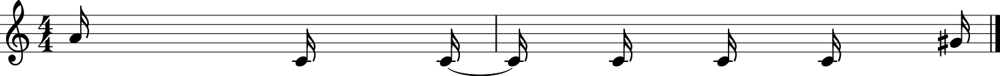

In [ ]:
seed_item.show()

In [ ]:
# seed_item.play()
play_wav(seed_item.stream)

#### Use seed to predict next sequence

In [ ]:
pred, full = learn.predict(seed_item, n_words=400, temperatures=(1.1,0.4), min_bars=12, top_k=24, top_p=0.7)

/content/musicautobot/musicautobot/music_transformer/learner.py:130: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_choices = len(probs.nonzero().view(-1))


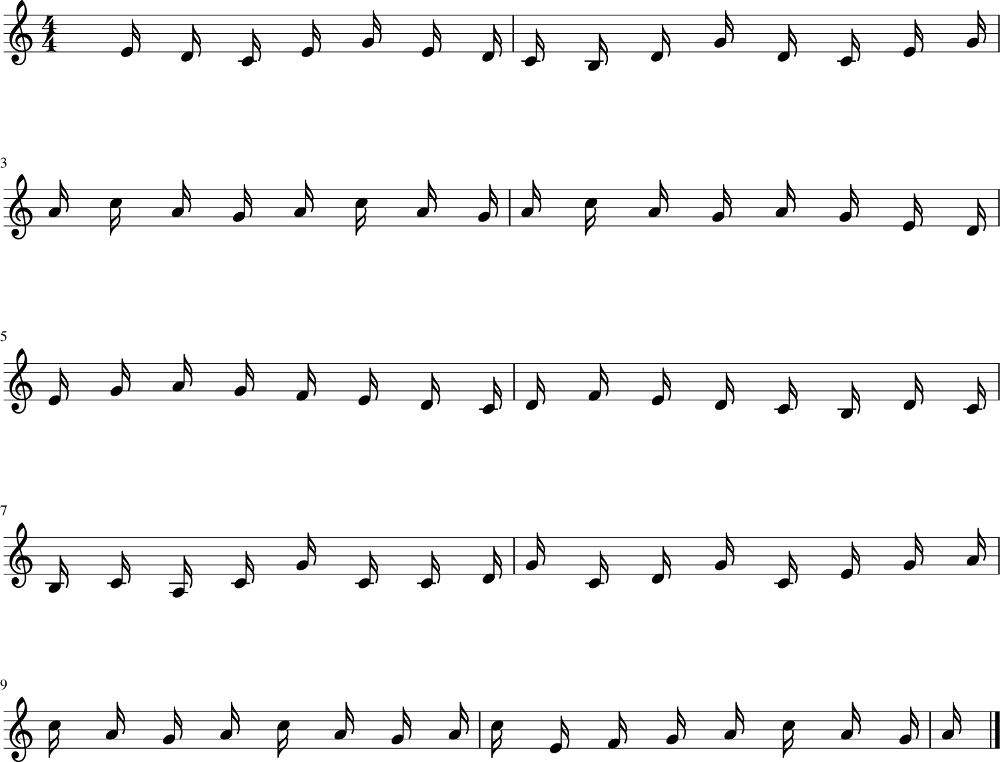

In [ ]:
pred.show()

In [ ]:
play_wav(pred.stream)

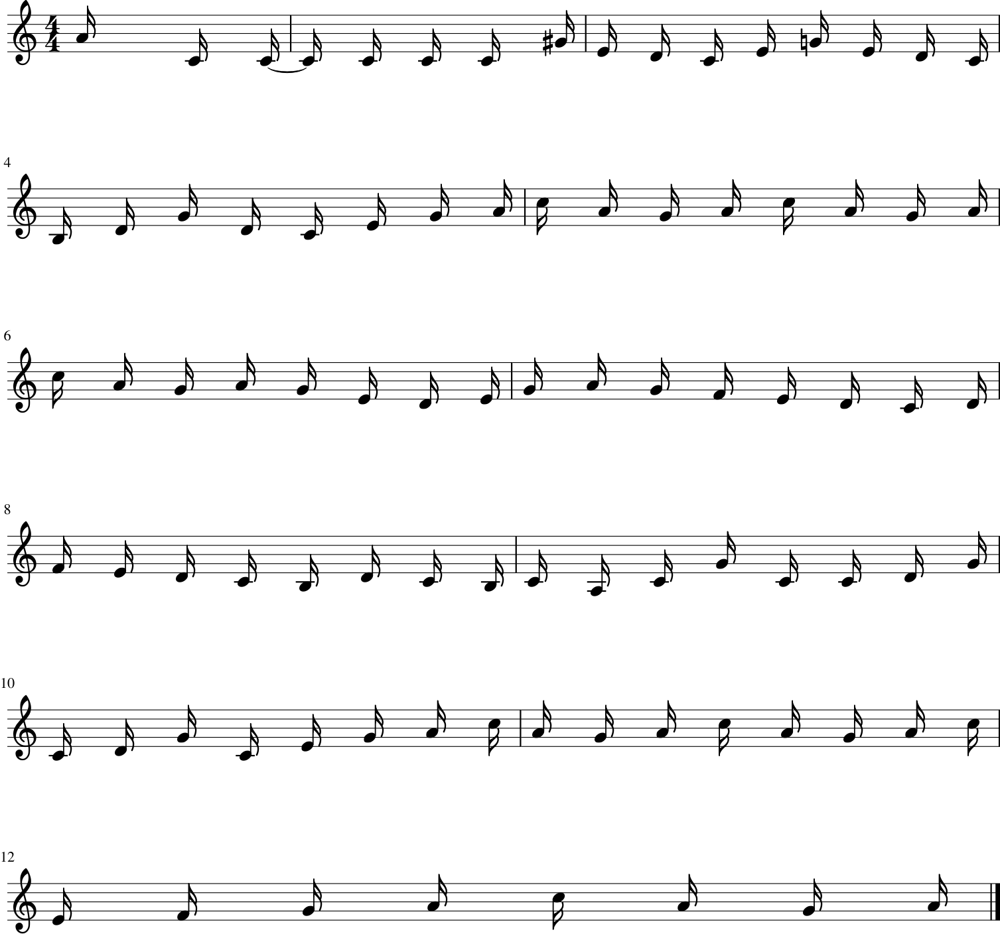

In [ ]:
full_song = seed_item.append(pred); full_song.show()

In [ ]:
play_wav(full_song.stream)

#### Add More Randomness to prediction

In [ ]:
note_temp = 1.4 # Determines amount of variation in note pitches
dur_temp = 0.8 # Amount of randomness in rhythm
top_k = 30
pred, full = learn.predict(seed_item, n_words=400, temperatures=(note_temp, dur_temp), min_bars=12, top_k=top_k, top_p=0.7)

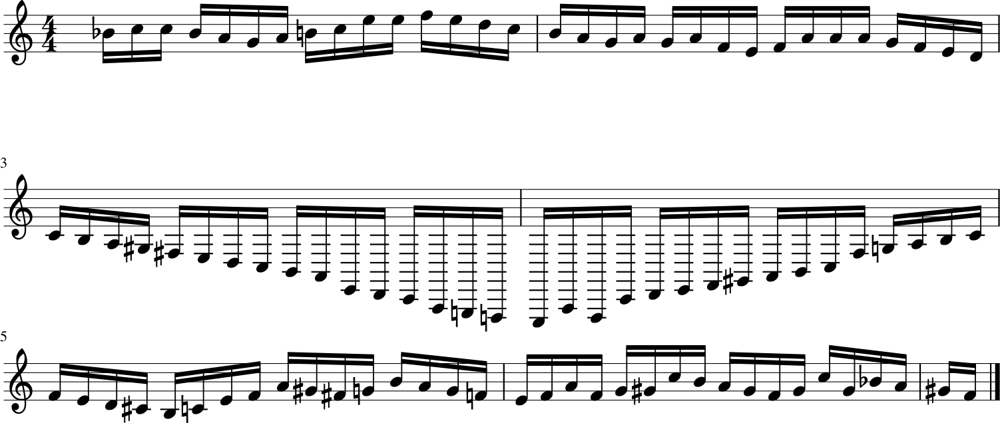

In [ ]:
pred.show()

In [ ]:
play_wav(pred.stream)

### Pop Music Theory

According to hooktheory, the most popular chord progression is I-V-vi-IV  
https://www.hooktheory.com/theorytab/common-chord-progressions

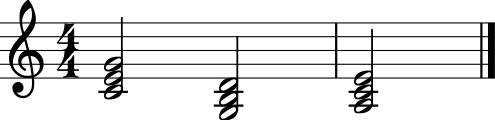

In [ ]:
# Let's create a partial progression I-V-vi
p = music21.stream.Part()
p.append(music21.chord.Chord('C4 E4 G4', type='half')) # I
p.append(music21.chord.Chord('G3 B3 D4', type='half')) # V
p.append(music21.chord.Chord('A3 C4 E4', type='half')) # vi
s = music21.stream.Score([p])
chord_item = MusicItem.from_stream(s, vocab)
chord_item.show()

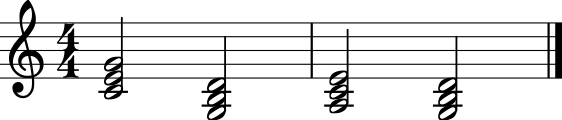

In [ ]:
temperaturs = (0.5,0.5) # Let's lower the note randomness for this test
pred, full = learn.predict(chord_item, n_words=10, temperatures=(0.5,0.5))
full.show()

In [ ]:
# Predicted chords - IV
play_wav(pred.stream)

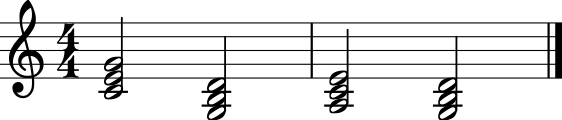

In [ ]:
# Full sequence
chord_item.append(pred).show()

Looks like it predicted the most popular progression!

#### Predict without a starting sequence

In [ ]:
empty_item = MusicItem.empty(vocab)

In [ ]:
pred, full = learn.predict(empty_item, n_words=200)

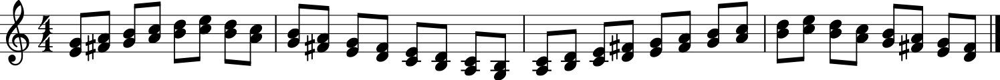

In [ ]:
pred.show()

In [ ]:
play_wav(pred.stream)